In [ ]:
import os
import glob
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F
from torchvision.transforms import ToTensor



Total videos in dataset: 1250
Number of unique actions: 25


In [ ]:

class VideoDataset:
    def __init__(self, base_dir='HMDB_simp'):
        self.base_dir = base_dir
        self.videos = []
        self._load_video_paths()
    
    def _load_video_paths(self):
        """Initialize video metadata without loading frames"""
        for action in os.listdir(self.base_dir):
            action_path = os.path.join(self.base_dir, action)
            if os.path.isdir(action_path):
                for video_id in os.listdir(action_path):
                    video_path = os.path.join(action_path, video_id)
                    if os.path.isdir(video_path):
                        frame_paths = sorted(glob.glob(os.path.join(video_path, '*.jpg')))
                        self.videos.append({
                            'action': action,
                            'id': video_id,
                            'frame_paths': frame_paths,
                            'frames': None  # Will be loaded on first access
                        })            
    
    def get_video_frames(self, index):
        frames = []
        for frame_path in self.videos[index]['frame_paths']:
            img = Image.open(frame_path)
            frames.append(np.array(img))
        return frames
    
    def __len__(self):
        return len(self.videos)
    
    def __getitem__(self, index):
        return {
            'action': self.videos[index]['action'],
            'id': self.videos[index]['id'],
            'frames': self.get_video_frames(index)
        }

# Usage example:
dataset = VideoDataset()
print(f"Total videos in dataset: {len(dataset)}")
print(f"Number of unique actions: {len(set(v['action'] for v in dataset.videos))}")



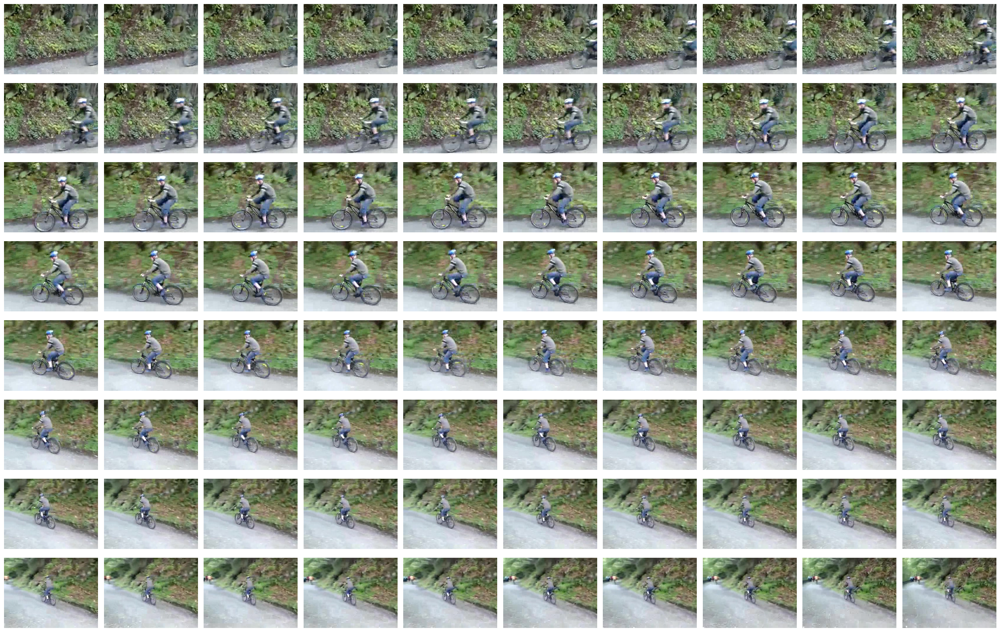

In [2]:
import matplotlib.pyplot as plt

def display_video_frames(frames, num_cols=10):
    """
    Display all frames of a video in a grid layout
    
    Args:
        video_data: Dictionary containing video information including frames
        num_cols: Number of columns in the grid display
    """    
    num_frames = len(frames)
    num_rows = (num_frames + num_cols - 1) // num_cols
    
    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 2*num_rows))
    # fig.suptitle(f"Action: {video_data['action']}, Video ID: {video_data['id']}")
    
    # Flatten axes array for easier indexing
    axes = axes.flatten() if num_rows > 1 else [axes] if num_cols == 1 else axes
    
    # Display each frame
    for i in range(num_frames):
        axes[i].imshow(frames[i])
        axes[i].axis('off')
        # axes[i].set_title(f'Frame {i+1}')
    
    # Turn off any empty subplots
    for i in range(num_frames, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
video = dataset[0]  # Get first video
display_video_frames(video['frames'])


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity
from abc import ABC, abstractmethod

class FrameImportanceAnalyzer(ABC):
    """Base class for frame importance analysis techniques."""
    
    def __init__(self, name):
        self.name = name
    
    @abstractmethod
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        """
        Compute importance score between two frames.
        
        Args:
            prev_frame: Previous frame
            curr_frame: Current frame
            visualize: Whether to visualize the difference
            
        Returns:
            score: Importance score (higher means more different/important)
            vis_img: Visualization image (if visualize=True, else None)
        """
        pass
    
    def visualize_difference(self, prev_frame, curr_frame):
        """Default visualization method that can be overridden by subclasses."""
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
            
        # Calculate absolute difference
        diff = cv2.absdiff(prev_gray, curr_gray)
        
        # Create a colormap for better visualization
        diff_color = cv2.applyColorMap(diff, cv2.COLORMAP_JET)
        
        # Convert BGR to RGB for visualization
        diff_color_rgb = cv2.cvtColor(diff_color, cv2.COLOR_BGR2RGB)
        
        return diff_color_rgb


class CrossCorrelationAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using cross-correlation."""
    
    def __init__(self):
        super().__init__("Cross-Correlation")
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Normalize images
        prev_norm = (prev_gray - np.mean(prev_gray)) / np.std(prev_gray)
        curr_norm = (curr_gray - np.mean(curr_gray)) / np.std(curr_gray)
        
        # Calculate cross-correlation
        correlation = np.mean(prev_norm * curr_norm)
        
        # Convert to dissimilarity score (higher means more different)
        score = 1.0 - (correlation + 1) / 2
        
        # Visualization
        vis_img = None
        if visualize:
            # Create correlation map
            corr_map = prev_norm * curr_norm
            corr_map = (corr_map - np.min(corr_map)) / (np.max(corr_map) - np.min(corr_map)) * 255
            corr_map = corr_map.astype(np.uint8)
            vis_img = cv2.applyColorMap(corr_map, cv2.COLORMAP_JET)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
        
        return score, vis_img


class FrameDifferenceAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using simple frame difference."""
    
    def __init__(self):
        super().__init__("Frame Difference")
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Calculate absolute difference
        diff = cv2.absdiff(prev_gray, curr_gray)
        
        # Calculate mean difference as score
        score = np.mean(diff) / 255.0
        
        # Visualization
        vis_img = None
        if visualize:
            vis_img = cv2.applyColorMap(diff, cv2.COLORMAP_JET)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
        
        return score, vis_img


class SSIMAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using Structural Similarity Index (SSIM)."""
    
    def __init__(self):
        super().__init__("SSIM")
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Calculate SSIM
        score, diff_map = structural_similarity(prev_gray, curr_gray, full=True)
        
        # Convert to dissimilarity (higher means more different)
        score = 1.0 - score
        
        # Visualization
        vis_img = None
        if visualize:
            # Convert diff_map to uint8 for visualization
            diff_map = (diff_map * 255).astype(np.uint8)
            vis_img = cv2.applyColorMap(255 - diff_map, cv2.COLORMAP_JET)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
        
        return score, vis_img


class OpticalFlowAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using optical flow."""
    
    def __init__(self):
        super().__init__("Optical Flow")
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Calculate optical flow using Farneback method
        flow = cv2.calcOpticalFlowFarneback(prev_gray, curr_gray, None, 
                                           0.5, 3, 15, 3, 5, 1.2, 0)
        
        # Calculate magnitude of flow vectors
        magnitude = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2)
        
        # Calculate mean magnitude as score
        score = np.mean(magnitude) / 100.0  # Normalize to roughly 0-1 range
        if score > 1.0:
            score = 1.0
        
        # Visualization
        vis_img = None
        if visualize:
            # Convert magnitude to uint8 for visualization
            mag_norm = np.clip(magnitude * 10, 0, 255).astype(np.uint8)
            vis_img = cv2.applyColorMap(mag_norm, cv2.COLORMAP_JET)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
            
            # Alternatively, use HSV visualization for flow direction and magnitude
            hsv = np.zeros((prev_frame.shape[0], prev_frame.shape[1], 3), dtype=np.uint8)
            hsv[..., 0] = np.degrees(np.arctan2(flow[..., 1], flow[..., 0])) / 2
            hsv[..., 1] = 255
            hsv[..., 2] = np.clip(magnitude * 10, 0, 255).astype(np.uint8)
            vis_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
        
        return score, vis_img


class FeatureMatchingAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using feature detection and matching."""
    
    def __init__(self):
        super().__init__("Feature Matching")
        # Initialize SIFT detector
        self.sift = cv2.SIFT_create()
        self.matcher = cv2.BFMatcher()
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Find keypoints and descriptors
        kp1, des1 = self.sift.detectAndCompute(prev_gray, None)
        kp2, des2 = self.sift.detectAndCompute(curr_gray, None)
        
        # If no features found, return high importance
        if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
            return 1.0, None if not visualize else np.zeros_like(prev_frame)
        
        # Match features
        matches = self.matcher.knnMatch(des1, des2, k=2)
        
        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)
        
        # Calculate match ratio
        match_ratio = len(good_matches) / max(len(kp1), len(kp2))
        
        # Convert to dissimilarity score
        score = 1.0 - match_ratio
        
        # Visualization
        vis_img = None
        if visualize:            
            # If we want to filter further to show only the most significant matches
            # Sort matches by distance (lower distance = better match)
            good_matches = sorted(good_matches, key=lambda x: x.distance)
            
            # Take only top matches (e.g., 10 or 20% of good matches, whichever is greater)
            num_significant = max(10, int(0.1 * len(good_matches)))
            significant_matches = good_matches[:num_significant]
            
            # Draw only the significant matches
            vis_img = cv2.drawMatches(prev_gray, kp1, curr_gray, kp2, significant_matches, None,
                                     flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
        return score, vis_img


class HistogramAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using histogram comparison."""
    
    def __init__(self):
        super().__init__("Histogram")
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to HSV color space
        if len(prev_frame.shape) == 3:
            prev_hsv = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2HSV)
            curr_hsv = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2HSV)
        else:
            # If grayscale, use as is
            prev_hsv = prev_frame
            curr_hsv = curr_frame
            
        # Calculate histograms
        if len(prev_frame.shape) == 3:
            # For color images, use H and S channels
            h_bins = 50
            s_bins = 60
            histSize = [h_bins, s_bins]
            h_ranges = [0, 180]
            s_ranges = [0, 256]
            ranges = h_ranges + s_ranges
            channels = [0, 1]  # Use H and S channels
        else:
            # For grayscale images
            histSize = [256]
            ranges = [0, 256]
            channels = [0]
        
        prev_hist = cv2.calcHist([prev_hsv], channels, None, histSize, ranges, accumulate=False)
        curr_hist = cv2.calcHist([curr_hsv], channels, None, histSize, ranges, accumulate=False)
        
        # Normalize histograms
        cv2.normalize(prev_hist, prev_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
        cv2.normalize(curr_hist, curr_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
        
        # Compare histograms
        similarity = cv2.compareHist(prev_hist, curr_hist, cv2.HISTCMP_CORREL)
        
        # Convert to dissimilarity score
        score = 1.0 - similarity
        
        # Visualization
        vis_img = None
        if visualize:
            if len(prev_frame.shape) == 3:
                # For color images, visualize the H and S histograms
                fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
                
                # Hue histogram
                h_prev = cv2.calcHist([prev_hsv], [0], None, [180], [0, 180])
                h_curr = cv2.calcHist([curr_hsv], [0], None, [180], [0, 180])
                ax1.plot(h_prev, color='blue', alpha=0.7, label='Previous Frame')
                ax1.plot(h_curr, color='red', alpha=0.7, label='Current Frame')
                ax1.set_title('Hue Histogram')
                ax1.legend()
                
                # Saturation histogram
                s_prev = cv2.calcHist([prev_hsv], [1], None, [256], [0, 256])
                s_curr = cv2.calcHist([curr_hsv], [1], None, [256], [0, 256])
                ax2.plot(s_prev, color='blue', alpha=0.7, label='Previous Frame')
                ax2.plot(s_curr, color='red', alpha=0.7, label='Current Frame')
                ax2.set_title('Saturation Histogram')
                ax2.legend()
                
                plt.tight_layout()
                
                # Convert plot to image
                fig.canvas.draw()
                vis_img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
                vis_img = vis_img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
                plt.close(fig)
            else:
                # For grayscale images
                fig, ax = plt.subplots(figsize=(8, 4))
                ax.plot(prev_hist, color='blue', alpha=0.7, label='Previous Frame')
                ax.plot(curr_hist, color='red', alpha=0.7, label='Current Frame')
                ax.set_title('Grayscale Histogram')
                ax.legend()
                
                plt.tight_layout()
                
                # Convert plot to image
                fig.canvas.draw()
                vis_img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
                vis_img = vis_img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
                plt.close(fig)
        
        return score, vis_img


class SceneChangeDetector(FrameImportanceAnalyzer):
    """Frame importance analyzer for scene change detection."""
    
    def __init__(self, threshold=0.1):
        super().__init__("Scene Change")
        self.threshold = threshold
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to grayscale
        if len(prev_frame.shape) == 3:
            prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_RGB2GRAY)
            curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_RGB2GRAY)
        else:
            prev_gray = prev_frame
            curr_gray = curr_frame
        
        # Calculate absolute difference
        diff = cv2.absdiff(prev_gray, curr_gray)
        
        # Calculate percentage of pixels that changed significantly
        _, thresholded = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
        change_percentage = np.count_nonzero(thresholded) / thresholded.size
        
        # Score is the change percentage
        score = change_percentage
        
        # Visualization
        vis_img = None
        if visualize:
            # Create a visualization with the thresholded difference
            vis_img = cv2.applyColorMap(thresholded, cv2.COLORMAP_JET)
            # Convert BGR to RGB for visualization
            vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
        
        return score, vis_img

class SSIMCudaAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer using Structural Similarity Index (SSIM) with GPU support."""
    
    def __init__(self):
        super().__init__("SSIM-GPU")
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to_tensor = ToTensor()
        print(f"SSIM analyzer using device: {self.device}")
    
    def _gaussian_kernel(self, size=11, sigma=1.5):
        """Create a Gaussian kernel for SSIM computation."""
        coords = torch.arange(size, device=self.device).float() - size // 2
        
        # Create 1D Gaussian kernel
        kernel_1d = torch.exp(-(coords**2) / (2 * sigma**2))
        kernel_1d = kernel_1d / kernel_1d.sum()
        
        # Create 2D Gaussian kernel
        kernel_2d = kernel_1d.unsqueeze(0) * kernel_1d.unsqueeze(1)
        kernel_2d = kernel_2d.unsqueeze(0).unsqueeze(0)
        
        return kernel_2d
    
    def _ssim_tensor(self, img1, img2, window_size=11, k1=0.01, k2=0.03, L=1.0):
        """Compute SSIM between two PyTorch tensors."""
        # Constants
        c1 = (k1 * L) ** 2
        c2 = (k2 * L) ** 2
        
        # Generate Gaussian kernel
        window = self._gaussian_kernel(window_size).to(img1.device)
        window = window / window.sum()
        
        # Expand window for multi-channel images
        if img1.size(1) > 1:
            window = window.expand(img1.size(1), 1, window_size, window_size)
        
        # Calculate means
        mu1 = F.conv2d(img1, window, padding=window_size//2, groups=img1.size(1))
        mu2 = F.conv2d(img2, window, padding=window_size//2, groups=img2.size(1))
        
        mu1_sq = mu1 ** 2
        mu2_sq = mu2 ** 2
        mu1_mu2 = mu1 * mu2
        
        # Calculate variances and covariance
        sigma1_sq = F.conv2d(img1 * img1, window, padding=window_size//2, groups=img1.size(1)) - mu1_sq
        sigma2_sq = F.conv2d(img2 * img2, window, padding=window_size//2, groups=img2.size(1)) - mu2_sq
        sigma12 = F.conv2d(img1 * img2, window, padding=window_size//2, groups=img1.size(1)) - mu1_mu2
        
        # SSIM formula
        ssim_map = ((2 * mu1_mu2 + c1) * (2 * sigma12 + c2)) / ((mu1_sq + mu2_sq + c1) * (sigma1_sq + sigma2_sq + c2))
        
        # Return mean SSIM
        return ssim_map.mean()
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        # Convert frames to PyTorch tensors
        if len(prev_frame.shape) == 3:
            # Convert from BGR to RGB
            prev_rgb = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2RGB)
            curr_rgb = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2RGB)
            
            # Convert to tensors [0, 1]
            prev_tensor = self.to_tensor(prev_rgb).unsqueeze(0).to(self.device)
            curr_tensor = self.to_tensor(curr_rgb).unsqueeze(0).to(self.device)
        else:
            # For grayscale images
            prev_tensor = torch.from_numpy(prev_frame).float().unsqueeze(0).unsqueeze(0) / 255.0
            curr_tensor = torch.from_numpy(curr_frame).float().unsqueeze(0).unsqueeze(0) / 255.0
            prev_tensor = prev_tensor.to(self.device)
            curr_tensor = curr_tensor.to(self.device)
        
        # Calculate SSIM
        with torch.no_grad():
            ssim_value = self._ssim_tensor(prev_tensor, curr_tensor)
            ssim_value = ssim_value.item()
        
        # Convert to dissimilarity (higher means more different)
        score = 1.0 - ssim_value
        
        # Visualization
        vis_img = None
        if visualize:
            # For visualization, we need to compute the SSIM map
            with torch.no_grad():
                # Constants
                L = 1.0
                k1 = 0.01
                k2 = 0.03
                c1 = (k1 * L) ** 2
                c2 = (k2 * L) ** 2
                
                # Generate Gaussian kernel
                window_size = 11
                window = self._gaussian_kernel(window_size).to(self.device)
                window = window / window.sum()
                
                # Expand window for multi-channel images
                if prev_tensor.size(1) > 1:
                    window = window.expand(prev_tensor.size(1), 1, window_size, window_size)
                
                # Calculate means
                mu1 = F.conv2d(prev_tensor, window, padding=window_size//2, groups=prev_tensor.size(1))
                mu2 = F.conv2d(curr_tensor, window, padding=window_size//2, groups=curr_tensor.size(1))
                
                mu1_sq = mu1 ** 2
                mu2_sq = mu2 ** 2
                mu1_mu2 = mu1 * mu2
                
                # Calculate variances and covariance
                sigma1_sq = F.conv2d(prev_tensor * prev_tensor, window, padding=window_size//2, 
                                     groups=prev_tensor.size(1)) - mu1_sq
                sigma2_sq = F.conv2d(curr_tensor * curr_tensor, window, padding=window_size//2, 
                                     groups=curr_tensor.size(1)) - mu2_sq
                sigma12 = F.conv2d(prev_tensor * curr_tensor, window, padding=window_size//2, 
                                   groups=prev_tensor.size(1)) - mu1_mu2
                
                # SSIM formula for each pixel
                ssim_map = ((2 * mu1_mu2 + c1) * (2 * sigma12 + c2)) / ((mu1_sq + mu2_sq + c1) * (sigma1_sq + sigma2_sq + c2))
                
                # Convert to dissimilarity map (1 - SSIM)
                diff_map = 1.0 - ssim_map
                
                # Take channel mean if multi-channel
                if diff_map.size(1) > 1:
                    diff_map = diff_map.mean(1, keepdim=True)
                
                # Convert to numpy for visualization
                diff_map = diff_map.squeeze().cpu().numpy()
                
                # Scale to 0-255 for visualization
                diff_map_uint8 = (diff_map * 255).astype(np.uint8)
                
                # Apply colormap
                vis_img = cv2.applyColorMap(diff_map_uint8, cv2.COLORMAP_JET)
        
        return score, vis_img

class CombinedAnalyzer(FrameImportanceAnalyzer):
    """Frame importance analyzer that combines multiple methods."""
    
    def __init__(self, analyzers=None, weights=None):
        super().__init__("Combined")
        
        # Default analyzers if none provided
        if analyzers is None:
            self.analyzers = [
                SSIMAnalyzer(),
                HistogramAnalyzer(),
                OpticalFlowAnalyzer()
            ]
        else:
            self.analyzers = analyzers
        
        # Default to equal weights if none provided
        if weights is None:
            self.weights = [1.0 / len(self.analyzers)] * len(self.analyzers)
        else:
            # Normalize weights
            total = sum(weights)
            self.weights = [w / total for w in weights]
    
    def compute_score(self, prev_frame, curr_frame, visualize=False):
        scores = []
        vis_images = []
        
        # Compute scores for each analyzer
        for analyzer in self.analyzers:
            score, vis_img = analyzer.compute_score(prev_frame, curr_frame, visualize)
            scores.append(score)
            if visualize:
                vis_images.append(vis_img)
        
        # Compute weighted average
        combined_score = sum(s * w for s, w in zip(scores, self.weights))
        
        # Visualization
        vis_img = None
        if visualize:
            # Create a grid of visualizations
            rows = (len(vis_images) + 1) // 2
            cols = min(2, len(vis_images))
            
            fig, axes = plt.subplots(rows, cols, figsize=(12, 6 * rows))
            if rows == 1 and cols == 1:
                axes = np.array([axes])
            axes = axes.flatten()
            
            for i, (analyzer, vis) in enumerate(zip(self.analyzers, vis_images)):
                if i < len(axes):
                    if vis is not None:
                        if len(vis.shape) == 3:
                            axes[i].imshow(vis)  # Already in RGB format
                        else:
                            axes[i].imshow(vis, cmap='jet')
                    axes[i].set_title(f"{analyzer.name}: {scores[i]:.4f}")
                    axes[i].axis('off')
            
            # Hide unused subplots
            for i in range(len(vis_images), len(axes)):
                axes[i].axis('off')
            
            plt.tight_layout()
            
            # Convert plot to image
            fig.canvas.draw()
            vis_img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
            vis_img = vis_img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
            plt.close(fig)
        
        return combined_score, vis_img


In [11]:
# Example usage function
def analyze_video_importance(video_frames, analyzer, sample_rate=1, visualize=False):
    """
    Analyze frame importance in a video.
    
    Args:
        video_frames: List or array of video frames in memory
        analyzer: FrameImportanceAnalyzer instance
        sample_rate: Process every Nth frame
        visualize: Whether to visualize differences
    
    Returns:
        List of importance scores
        List of visualization images (if visualize=True, else empty list)
    """
    # Check if frames are valid
    if len(video_frames) == 0:
        print("Error: Empty video frames")
        return [], []
    
    # Initialize variables
    importance_scores = []
    vis_images = []
    prev_frame = None
    
    # Process video frames
    for frame_idx in range(0, len(video_frames), sample_rate):
        frame = video_frames[frame_idx]
        
        # Skip first frame (no previous frame to compare)
        if prev_frame is None:
            prev_frame = frame
            importance_scores.append(1.0)  # First frame is always important
            if visualize:
                vis_images.append(frame)  # Just use the frame itself for first frame
            continue
        
        # Calculate importance
        score, vis_img = analyzer.compute_score(prev_frame, frame, visualize)
        importance_scores.append(score)
        
        if visualize:
            vis_images.append(vis_img)
        
        prev_frame = frame
    
    return importance_scores, vis_images


# Example visualization function
def visualize_importance_scores(scores, method_name):
    """Visualize importance scores as a line plot."""
    plt.figure(figsize=(12, 6))
    plt.plot(scores)
    plt.title(f'Frame Importance Scores ({method_name})')
    plt.xlabel('Frame Index')
    plt.ylabel('Importance Score')
    plt.grid(True)
    plt.show()
    
    # Find most important frames
    threshold = np.mean(scores) + np.std(scores)
    important_frames = [i for i, score in enumerate(scores) if score > threshold]
    
    print(f"Found {len(important_frames)} important frames out of {len(scores)}")
    return important_frames


# Example comparison function
def compare_analyzers(video_frames, analyzers=None, sample_rate=1):
    """Compare different frame importance analyzers on the same video."""
    if analyzers is None:
        analyzers = [
            FrameDifferenceAnalyzer(),
            CrossCorrelationAnalyzer(),
            SSIMAnalyzer(),
            OpticalFlowAnalyzer(),
            HistogramAnalyzer(),
            FeatureMatchingAnalyzer(),
            SceneChangeDetector(),
            CombinedAnalyzer()
        ]
    
    all_scores = []
    
    for analyzer in analyzers:
        print(f"Analyzing with {analyzer.name}...")
        scores, _ = analyze_video_importance(video_frames, analyzer, sample_rate)
        all_scores.append(scores)
    
    # Plot all scores
    plt.figure(figsize=(14, 8))
    for i, (analyzer, scores) in enumerate(zip(analyzers, all_scores)):
        plt.plot(scores, label=analyzer.name)
    
    plt.title('Comparison of Frame Importance Analyzers')
    plt.xlabel('Frame Index')
    plt.ylabel('Importance Score')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return all_scores


# Example of how to use the visualization capabilities
def demo_visualization(prev_frame, curr_frame):
    """Demonstrate visualization capabilities of different analyzers."""
    analyzers = [
        FrameDifferenceAnalyzer(),
        CrossCorrelationAnalyzer(),
        SSIMAnalyzer(),
        OpticalFlowAnalyzer(),
        HistogramAnalyzer(),
        FeatureMatchingAnalyzer(),
        SceneChangeDetector()
    ]
    
    # Create a grid of visualizations
    fig, axes = plt.subplots(1, 2 + len(analyzers), figsize=(25, 8))
    
    axes[0].imshow(prev_frame)
    axes[0].set_title('Frame A')
    axes[0].axis('off')
    axes[1].imshow(curr_frame)
    axes[1].set_title('Frame B')
    axes[1].axis('off')
    for i, analyzer in enumerate(analyzers):
        # Get score and visualization
        score, vis_img = analyzer.compute_score(prev_frame, curr_frame, visualize=True)
        
        # Display visualization
        if vis_img is not None:
            if len(vis_img.shape) == 3:
                axes[i+2].imshow(vis_img)
            else:
                axes[i+2].imshow(vis_img, cmap='jet')
        
        axes[i+2].set_title(f"{analyzer.name} ({score:.4f})")
        axes[i+2].axis('off')
    
    plt.tight_layout()
    plt.show()


def visualize_video_frames(video_frames, step=1, max_pairs=10):
    """Visualize analyzer results for consecutive frame pairs in a video.
    
    Args:
        video_frames: List of video frames
        step: Step size between frames to analyze (default: 1)
        max_pairs: Maximum number of frame pairs to visualize (default: 10)
    """
    # Determine how many pairs to process
    num_frames = len(video_frames)
    if num_frames < 2:
        print("Need at least 2 frames to visualize")
        return
    
    pairs_to_process = min(max_pairs, (num_frames - 1) // step)
    
    # Create analyzers list
    analyzers = [
        FrameDifferenceAnalyzer(),
        CrossCorrelationAnalyzer(),
        SSIMAnalyzer(),
        OpticalFlowAnalyzer(),
        HistogramAnalyzer(),
        FeatureMatchingAnalyzer(),
        SceneChangeDetector()
    ]
    
    # Create a single figure with subplots for all frame pairs
    fig_height = 2 * pairs_to_process
    fig, axes = plt.subplots(pairs_to_process, 2 + len(analyzers), figsize=(25, fig_height))
    
    for pair_idx in range(pairs_to_process):
        frame_idx = pair_idx * step
        prev_frame = video_frames[frame_idx]
        curr_frame = video_frames[frame_idx + 1]
        
        # If only one pair, axes won't be 2D, so we need to handle that case
        if pairs_to_process == 1:
            ax_row = axes
        else:
            ax_row = axes[pair_idx]
        
        # Display original frames
        ax_row[0].imshow(prev_frame)
        ax_row[0].set_title(f'Frame {frame_idx}')
        ax_row[0].axis('off')
        
        ax_row[1].imshow(curr_frame)
        ax_row[1].set_title(f'Frame {frame_idx + 1}')
        ax_row[1].axis('off')
        
        # Display analyzer results
        for i, analyzer in enumerate(analyzers):
            # Get score and visualization
            score, vis_img = analyzer.compute_score(prev_frame, curr_frame, visualize=True)
            
            # Display visualization
            if vis_img is not None:
                if len(vis_img.shape) == 3:
                    ax_row[i+2].imshow(vis_img)
                else:
                    ax_row[i+2].imshow(vis_img, cmap='jet')
            
            ax_row[i+2].set_title(f"{analyzer.name} ({score:.4f})")
            ax_row[i+2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
def filter_similar_frames(frames, analyzer_threshold_pairs=None, min_frames=8):
    """
    Filter out similar frames from a sequence based on similarity scores using majority voting.
    
    Args:
        frames: List of video frames
        analyzer_threshold_pairs: List of [analyzer, threshold] pairs for voting
                                 (default: [[SSIMAnalyzer(), 0.95]])
    
    Returns:
        Tuple containing:
        - List of filtered frames with similar consecutive frames removed
        - List of tuples (idx1, idx2, scores_dict) of removed frame pairs
    """
    if len(frames) <= 1:
        return frames.copy(), []
    
    # Default to SSIM if no analyzer pairs are provided
    if analyzer_threshold_pairs is None:
        analyzer_threshold_pairs = [(SSIMAnalyzer(), 0.2), (SceneChangeDetector(), 0.1)]
    
    filtered_frames = frames.copy()
    removed_pairs = []  # Track removed pairs: (original_idx1, original_idx2, scores_dict)
    
    # Map to track original indices after removals
    original_indices = list(range(len(frames)))
    
    i = 0
    while i < len(filtered_frames) - 1:
        # Compare current frame with next frame using all analyzers
        votes_to_remove = 0
        scores_dict = {}
        
        for analyzer, threshold in analyzer_threshold_pairs:
            score, _ = analyzer.compute_score(filtered_frames[i], filtered_frames[i+1])
            scores_dict[analyzer.name] = score
            
            # Count vote to remove if similarity is below threshold
            if score < threshold:
                votes_to_remove += 1
        
        # Majority voting: remove if more than half of analyzers vote to remove
        if votes_to_remove > len(analyzer_threshold_pairs) // 2:
            # Store the original indices and scores of the removed pair
            removed_pairs.append((original_indices[i], original_indices[i+1], scores_dict))
            
            # Remove the frame and its index mapping
            filtered_frames.pop(i+1)
            original_indices.pop(i+1)
            
            if len(filtered_frames) < min_frames:
                return frames.copy(), []
            
            # Don't increment i since we need to compare with the new next frame
        else:
            # Move to next frame if no removal happened
            i += 1
    return filtered_frames, removed_pairs
def visualize_filtered_frames(frames, analyzer_threshold_pairs=None, max_pairs=5):
    """
    Visualize the original and filtered frames side by side.
    
    Args:
        frames: List of video frames
        threshold: Similarity threshold (default: 0.95)
        analyzer: Analyzer to use for comparison (default: SSIMAnalyzer)
        max_pairs: Maximum number of frame pairs to display
    """        
    filtered_frames, removed_pairs = filter_similar_frames(frames, analyzer_threshold_pairs)
    
    # Calculate reduction
    reduction_percent = (1 - len(filtered_frames) / len(frames)) * 100
    
    print(f"Original frames: {len(frames)}")
    print(f"Filtered frames: {len(filtered_frames)}")
    print(f"Reduction: {reduction_percent:.2f}%")
    print(f"Removed pairs: {len(removed_pairs)}")
    
    display_video_frames(frames, )
    display_video_frames(filtered_frames, )
    
    # Visualize some removed pairs if any exist
    if removed_pairs:
        # Show at most max_pairs removed pairs
        pairs_to_show = min(max_pairs, len(removed_pairs))
        step = max(1, len(removed_pairs) // pairs_to_show)
        
        fig3, axes3 = plt.subplots(pairs_to_show, 2, figsize=(10, 4 * pairs_to_show))
        
        for i in range(pairs_to_show):
            pair_idx = i * step
            idx1, idx2, scores = removed_pairs[pair_idx]
            
            if pairs_to_show == 1:
                ax_row = axes3
            else:
                ax_row = axes3[i]
                
            ax_row[0].imshow(frames[idx1])
            ax_row[0].set_title(f"Frame {idx1}")
            ax_row[0].axis('off')
            
            ax_row[1].imshow(frames[idx2])
            ax_row[1].set_title(f"Removed Frame {idx2} (Scores: {scores})")
            ax_row[1].axis('off')
            
        plt.tight_layout()
        plt.show()



# Exploration

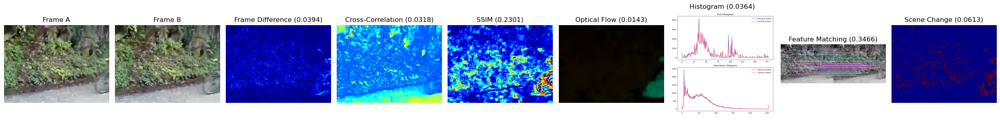

In [5]:
demo_visualization(video['frames'][0], video['frames'][1])

In [ ]:
visualize_video_frames(video['frames'], max_pairs=50)

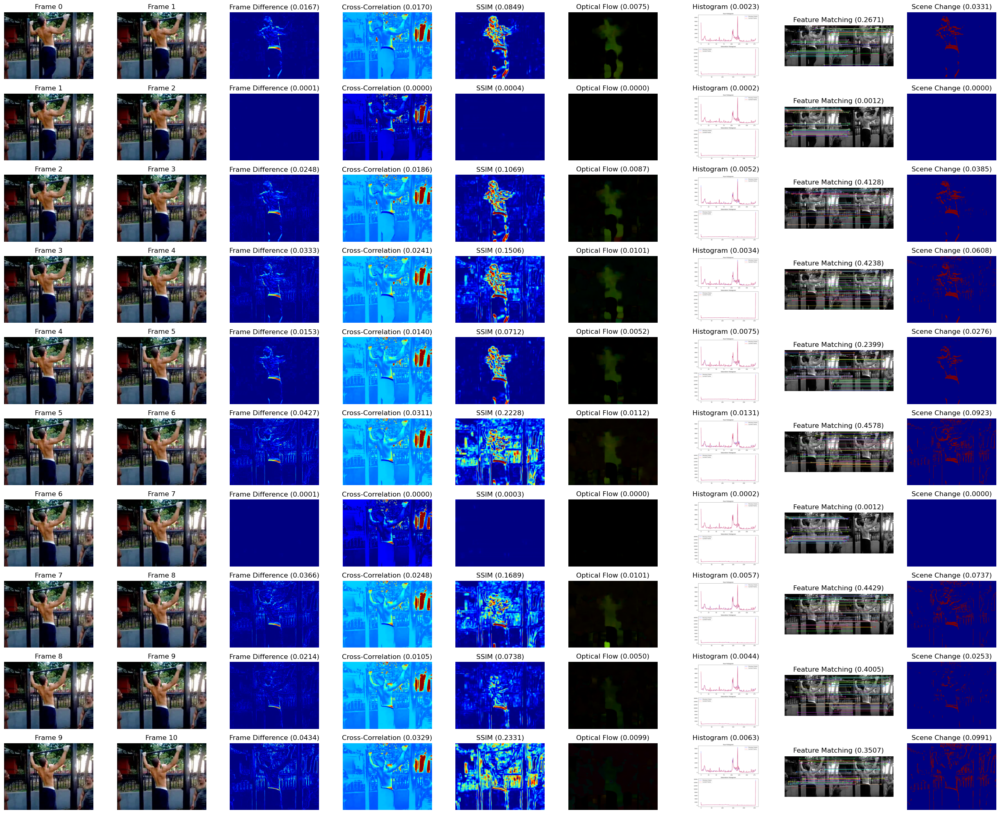

In [8]:
import random
visualize_video_frames(dataset[random.randint(0, len(dataset))]['frames'], max_pairs=10)

In [86]:
test = dataset[random.randint(0, len(dataset))]

In [ ]:
visualize_video_frames(test['frames'], max_pairs=10)

In [ ]:
visualize_filtered_frames(dataset[17]['frames'], analyzer_threshold_pairs=[
    # (FrameDifferenceAnalyzer(), 0.05),``
    # (CrossCorrelationAnalyzer(), 0.04),
    # (SSIMAnalyzer(), 0.25),
    # (OpticalFlowAnalyzer(), 0.05),
    # (HistogramAnalyzer(), 0.02),
    # # (FeatureMatchingAnalyzer(), 0.45),
    # (SceneChangeDetector(), 0.15),
    
    (CrossCorrelationAnalyzer(), 0.04),
    (SSIMAnalyzer(), 0.15),
    (OpticalFlowAnalyzer(), 0.01),
    # (SceneChangeDetector(), 0.15),
    ],
                          max_pairs=10)

In [ ]:
from tqdm import tqdm
import os

original_frames_count = 0
filtered_frames_count = 0

for video in tqdm(dataset, total=len(dataset), postfix=f'Original: {original_frames_count}, Filtered: {filtered_frames_count}, Reduction: {(1-filtered_frames_count/original_frames_count)*100:.2f}%'):
    action, id = video['action'], video['id']
    
    save_dir = f'filtered/{action}/{id}/'
    
    # Skip if directory already exists (already processed)
    if os.path.exists(save_dir) and len(os.listdir(save_dir)) > 0:
        continue
    
    frames = video['frames']
    filtered_frames, removed_pairs = filter_similar_frames(frames, analyzer_threshold_pairs=[        
            (CrossCorrelationAnalyzer(), 0.04),
            (SSIMAnalyzer(), 0.15),
            (OpticalFlowAnalyzer(), 0.01),
        ],)

    original_frames_count += len(frames)
    filtered_frames_count += len(filtered_frames)
    
    
    os.makedirs(save_dir, exist_ok=True)
        
    for i, frame in enumerate(filtered_frames):    
        frame_path = os.path.join(save_dir, f'{i:05d}.jpg')
        cv2.imwrite(frame_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
    
    # Update the progress bar with current stats
    tqdm.set_postfix_str(f'Original: {original_frames_count}, Filtered: {filtered_frames_count}, Reduction: {(1-filtered_frames_count/original_frames_count)*100:.2f}%')
    
    # break

In [18]:
print(f'original_frames_count: {original_frames_count}, filtered_frames_count: {filtered_frames_count}, Reduction: {(1-filtered_frames_count/original_frames_count)*100:.2f}%')

original_frames_count: 11054, filtered_frames_count: 5499, Reduction: 50.25%


In [14]:
import os
from glob import glob
import pandas as pd

# Initialize dictionaries to store stats for each action
action_stats = {}

# Process original HMDB_simp directory
for action_dir in os.listdir('HMDB_simp'):
    action_path = os.path.join('HMDB_simp', action_dir)
    if os.path.isdir(action_path):
        # Initialize stats for this action
        if action_dir not in action_stats:
            action_stats[action_dir] = {
                'original_dirs': 0,
                'original_frames': 0,
                'original_dirs_less_than_8': 0,
                'filtered_dirs': 0,
                'filtered_frames': 0,
                'filtered_dirs_less_than_8': 0
            }
        
        for video_dir in os.listdir(action_path):
            video_path = os.path.join(action_path, video_dir)
            if os.path.isdir(video_path):
                files = glob(os.path.join(video_path, '*.jpg'))
                file_count = len(files)
                
                action_stats[action_dir]['original_dirs'] += 1
                action_stats[action_dir]['original_frames'] += file_count
                
                if file_count < 8:
                    action_stats[action_dir]['original_dirs_less_than_8'] += 1

# Process filtered directory
for action_dir in os.listdir('filtered'):
    action_path = os.path.join('filtered', action_dir)
    if os.path.isdir(action_path):
        # Make sure the action exists in our stats dictionary
        if action_dir not in action_stats:
            action_stats[action_dir] = {
                'original_dirs': 0,
                'original_frames': 0,
                'original_dirs_less_than_8': 0,
                'filtered_dirs': 0,
                'filtered_frames': 0,
                'filtered_dirs_less_than_8': 0
            }
        
        for video_dir in os.listdir(action_path):
            video_path = os.path.join(action_path, video_dir)
            if os.path.isdir(video_path):
                files = glob(os.path.join(video_path, '*.jpg'))
                file_count = len(files)
                
                action_stats[action_dir]['filtered_dirs'] += 1
                action_stats[action_dir]['filtered_frames'] += file_count
                
                if file_count < 8:
                    action_stats[action_dir]['filtered_dirs_less_than_8'] += 1

# Calculate reduction percentage for each action
for action in action_stats:
    orig_frames = action_stats[action]['original_frames']
    filt_frames = action_stats[action]['filtered_frames']
    
    if orig_frames > 0:
        reduction = (1 - filt_frames/orig_frames) * 100
        action_stats[action]['reduction_percent'] = f"{reduction:.2f}%"
    else:
        action_stats[action]['reduction_percent'] = "N/A"

# Convert to DataFrame for better display
df = pd.DataFrame.from_dict(action_stats, orient='index')

# Add totals row
totals = {
    'original_dirs': df['original_dirs'].sum(),
    'original_frames': df['original_frames'].sum(),
    'original_dirs_less_than_8': df['original_dirs_less_than_8'].sum(),
    'filtered_dirs': df['filtered_dirs'].sum(),
    'filtered_frames': df['filtered_frames'].sum(),
    'filtered_dirs_less_than_8': df['filtered_dirs_less_than_8'].sum(),
    'reduction_percent': f"{(1 - df['filtered_frames'].sum()/df['original_frames'].sum())*100:.2f}%"
}
df.loc['TOTAL'] = pd.Series(totals)


In [18]:
df[['original_frames', 'filtered_frames', 'original_dirs', 'filtered_dirs_less_than_8', 'reduction_percent']]

,original_frames,filtered_frames,original_dirs,filtered_dirs_less_than_8,reduction_percent
ride_bike,4818,2656,50,2,44.87%
smoke,7250,675,50,28,90.69%
golf,4024,457,50,28,88.64%
climb,8137,1407,50,12,82.71%
brush_hair,13250,1937,50,18,85.38%
shoot_bow,8777,1011,50,5,88.48%
kiss,9001,1023,50,10,88.63%
pushup,4661,852,50,12,81.72%
throw,4951,844,50,12,82.95%
eat,4450,507,50,25,88.61%
